In [ ]:
# Importing relevant modules.
import random
import matplotlib.pyplot as plt
import numpy as np
from pycocotools.coco import COCO
import skimage.io as io
import pandas as pd
import seaborn as sns
import os, json, time, random, math, shutil
from collections import defaultdict, Counter
from pathlib import Path
from PIL import Image, ImageOps
import torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import transforms
from pycocotools import mask as maskUtils
%matplotlib inline

# Import and mount Google Drive.
from google.colab import drive

drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
# Device setup
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)

Using device: cuda


In [ ]:
# Unzip the dataset file and store it in a folder called images.

#!unzip "/content/drive/MyDrive/RMDS_Segmentation_Assignment.zip" -d "/content/drive/MyDrive/coco2019/"

In [ ]:
# Total count of images
image_dir = "/content/drive/MyDrive/coco2019/"
image_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.gif', '.tiff')

image_count = sum(
    1 for root, dirs, files in os.walk(image_dir)
    for file in files
    if file.lower().endswith(image_extensions)
)

print(f"Total number of images: {image_count}")


Total number of images: 1260


In [ ]:
# Allowed (valid) extensions for ML
valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp')

def scan_image_dir(image_dir):
    valid_images = []
    invalid_images = []
    mac_junk = []

    for root, _, files in os.walk(image_dir):
        for file in files:
            file_path = os.path.join(root, file)
            ext = os.path.splitext(file)[1].lower()

            # MacOS junk (._abc.jpg or inside __MACOSX folder)
            if file.startswith("._") or "__MACOSX" in root:
                mac_junk.append(file_path)
                continue

            # VALID images (allowed for ML / VGG19)
            if ext in valid_extensions:
                valid_images.append(file_path)

            # INVALID images (gif, tiff, raw, webp, svg, etc.)
            elif ext not in valid_extensions:
                invalid_images.append(file_path)

    return valid_images, invalid_images, mac_junk


# Run the scan
valid_images, invalid_images, mac_junk = scan_image_dir(image_dir)

print(f"Valid images: {len(valid_images)}")
print(f"Invalid images (gif,tiff,...): {len(invalid_images)}")
print(f"Mac junk files: {len(mac_junk)}\n")

# Show first 20 invalid images
print("Sample invalid files:")
for f in invalid_images[:20]:
    print(f)

# Show Mac junk samples
print("\nSample MacOS junk:")
for f in mac_junk[:10]:
    print(f)


Valid images: 630
Invalid images (gif,tiff,...): 7
Mac junk files: 637

Sample invalid files:
/content/drive/MyDrive/coco2019/validation-300/labels.json
/content/drive/MyDrive/coco2019/validation-300/.DS_Store
/content/drive/MyDrive/coco2019/train-300/labels.json
/content/drive/MyDrive/coco2019/train-300/.DS_Store
/content/drive/MyDrive/coco2019/cleaned/train_cleaned_labels.json
/content/drive/MyDrive/coco2019/cleaned/val_cleaned_labels.json
/content/drive/MyDrive/coco2019/cleaned/maskrcnn_best.pth

Sample MacOS junk:
/content/drive/MyDrive/coco2019/__MACOSX/._test-30
/content/drive/MyDrive/coco2019/__MACOSX/._validation-300
/content/drive/MyDrive/coco2019/__MACOSX/._train-300
/content/drive/MyDrive/coco2019/__MACOSX/test-30/._000000050380.jpg
/content/drive/MyDrive/coco2019/__MACOSX/test-30/._000000491366.jpg
/content/drive/MyDrive/coco2019/__MACOSX/test-30/._000000292415.jpg
/content/drive/MyDrive/coco2019/__MACOSX/test-30/._000000489764.jpg
/content/drive/MyDrive/coco2019/__MACOSX/t


Total valid images: 630
Total removed: 0


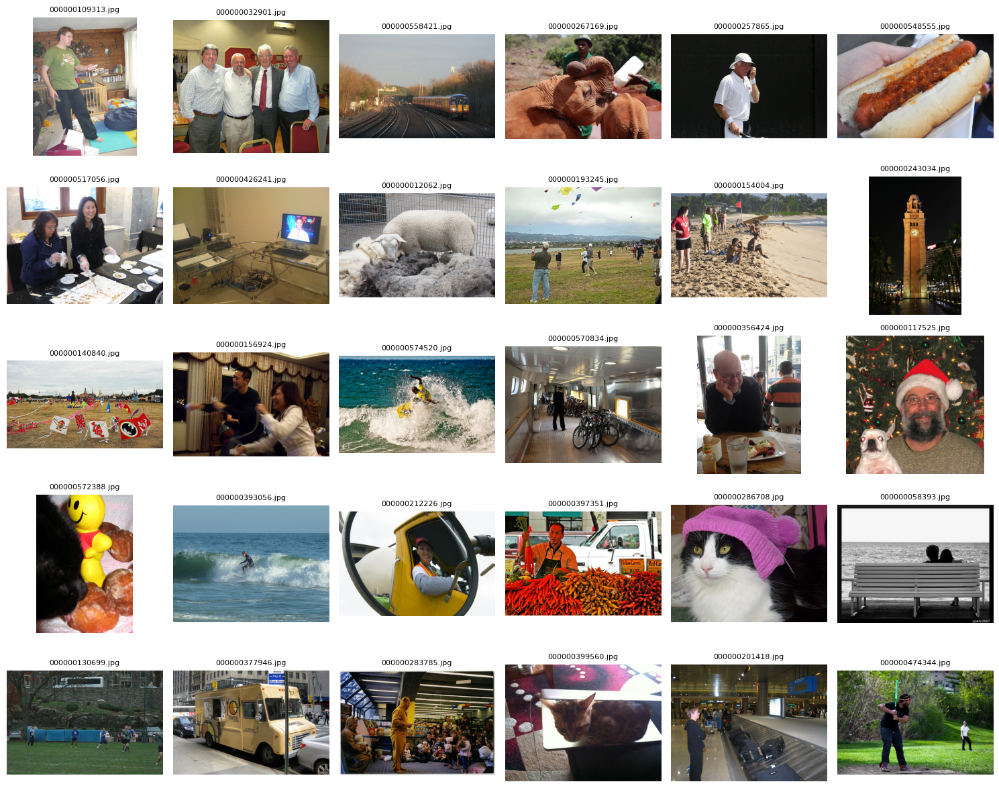

In [ ]:
# ============================================================================
# --------------------------------
#  Purpose:
#        Detects if an image is mostly black.
#        Removes unreadable or corrupted images.
#        Loads image in RGB
#        Creates a mask of TRUE where pixel == (0,0,0)
#       Calculates % of black pixels
#        If black % >= threshold (default 90%), mark as invalid
#
#  Why needed:
#       - Some dataset images may be blank or black due to download errors.
#       - These hurt Mask R-CNN training, so we remove them.
# ============================================================================
def is_mostly_black(path, threshold=0.9):
    """
    Returns True if:
        - The image is unreadable, OR
        - >= threshold (90% default) of the pixels are pure black.
    """
    try:
        # Load and convert to RGB
        img = Image.open(path).convert("RGB")
        arr = np.array(img)

        # Create a boolean mask: True where pixel is (0,0,0)
        black_pixels = np.all(arr == 0, axis=-1)
        black_ratio = black_pixels.mean()# Ratio of black pixels in image
        return black_ratio >= threshold  #True → remove image

    except:
        return True



# ============================================================================
#  STEP 1: Remove Mostly-Black or Unreadable Images
#  -----------------------------------------------
#  - valid_images: your existing list of cleaned image paths
#  - clean_valid_images: after filtering
#  - removed_images: list of images removed for being too black
# ============================================================================
clean_valid_images = []
removed_images = []

for img_path in valid_images:
    if is_mostly_black(img_path, threshold=0.9):   # 90% black threshold
        removed_images.append(img_path)
        print("Removed (mostly black):", img_path)
    else:
        clean_valid_images.append(img_path)

print("\nTotal valid images:", len(clean_valid_images))
print("Total removed:", len(removed_images))



# ============================================================================
#  STEP 2: Display 30 Random Valid Images in a 5x6 Grid
#  ---------------------------------------------------
#  Purpose:
#       - Visually confirm that remaining images are good quality
# ============================================================================
selected_images = random.sample(clean_valid_images, min(30, len(clean_valid_images)))

plt.figure(figsize=(15, 12))

for i, img_path in enumerate(selected_images):
    img = Image.open(img_path).convert("RGB")
    plt.subplot(5, 6, i+1)
    plt.imshow(img)
    plt.title(os.path.basename(img_path), fontsize=8)
    plt.axis("off")

plt.tight_layout()
plt.show()


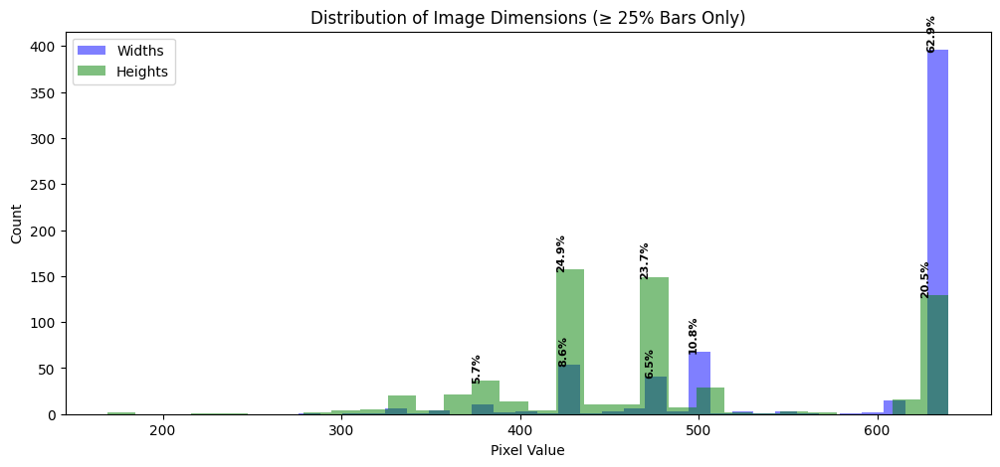

In [ ]:
# Helps decide resize strategy for DeepLabv3+, Mask R-CNN..
# Identifies very large or tiny images

from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

widths, heights = [], []

# Collect image dimensions
for path in valid_images:
    try:
        with Image.open(path) as img:
            widths.append(img.width)
            heights.append(img.height)
    except:
        print(f"Could not read: {path}")

# --------------------------
# Plot Histogram + % Labels
# --------------------------
plt.figure(figsize=(12, 5))

counts_w, bins_w, patches_w = plt.hist(widths, bins=30, alpha=0.5, label="Widths", color="blue")
counts_h, bins_h, patches_h = plt.hist(heights, bins=30, alpha=0.5, label="Heights", color="green")

total_images = len(widths)

# Add % labels to width bars (ONLY if > 5%)
for count, bin_edge in zip(counts_w, bins_w):
    if count > 0:
        pct = (count / total_images) * 100
        if pct > 5:  # show only if >= 5%
            plt.text(bin_edge, count, f"{pct:.1f}%", fontsize=8, rotation=90,fontweight='bold')

# Add % labels to height bars (ONLY if > 5%)
for count, bin_edge in zip(counts_h, bins_h):
    if count > 0:
        pct = (count / total_images) * 100
        if pct > 5:
            plt.text(bin_edge, count, f"{pct:.1f}%", fontsize=8, rotation=90,fontweight='bold')

plt.legend()
plt.title("Distribution of Image Dimensions (≥ 25% Bars Only)")
plt.xlabel("Pixel Value")
plt.ylabel("Count")
plt.show()

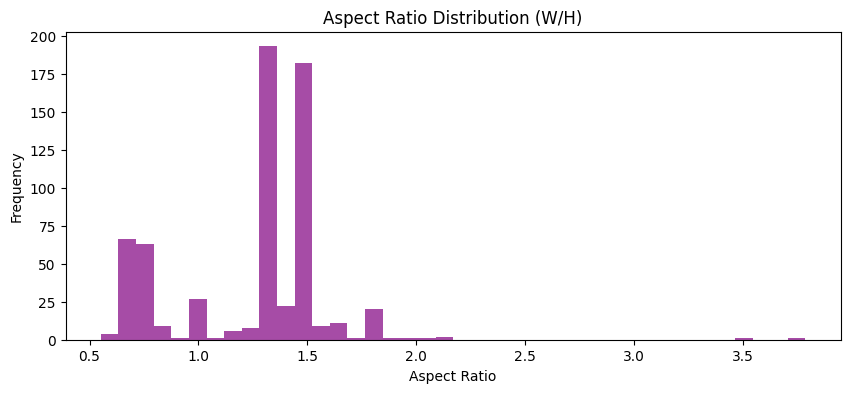

In [ ]:
#Important for Mask R-CNN anchors
#Helps decide resizing/cropping methods
aspect_ratios = np.array(widths) / np.array(heights)
plt.figure(figsize=(10,4))
plt.hist(aspect_ratios, bins=40, color="purple", alpha=0.7)
plt.title("Aspect Ratio Distribution (W/H)")
plt.xlabel("Aspect Ratio")
plt.ylabel("Frequency")
plt.show()

In [ ]:
import plotly.express as px
from collections import Counter, defaultdict

# Path to your COCO JSON
json_path = "/content/drive/MyDrive/coco2019/train-300/labels.json"

with open(json_path, "r") as f:
    coco = json.load(f)

images = pd.DataFrame(coco["images"])
annotations = pd.DataFrame(coco["annotations"])
categories = pd.DataFrame(coco["categories"])

print(images.head())
print(annotations.head())
print(categories.head())



with open(json_path, "r") as f:
    coco = json.load(f)

images = pd.DataFrame(coco["images"])
annotations = pd.DataFrame(coco["annotations"])
categories = pd.DataFrame(coco["categories"])

print("Images:", len(images))
print("Annotations:", len(annotations))
print("Categories:", len(categories))

   license         file_name  \
0        4  000000538364.jpg   
1        1  000000236166.jpg   
2        6  000000004134.jpg   
3        3  000000334521.jpg   
4        4  000000025057.jpg   

                                            coco_url  height  width  \
0  http://images.cocodataset.org/val2017/00000053...     480    640   
1  http://images.cocodataset.org/val2017/00000023...     640    426   
2  http://images.cocodataset.org/val2017/00000000...     425    640   
3  http://images.cocodataset.org/val2017/00000033...     375    500   
4  http://images.cocodataset.org/val2017/00000002...     427    640   

         date_captured                                         flickr_url  \
0  2013-11-15 19:00:10  http://farm9.staticflickr.com/8042/7933423348_...   
1  2013-11-17 03:44:11  http://farm6.staticflickr.com/5235/5907035871_...   
2  2013-11-18 02:54:21  http://farm9.staticflickr.com/8154/6988791438_...   
3  2013-11-17 01:37:34  http://farm1.staticflickr.com/71/220866513_d3b..

In [ ]:
target_classes = ["person", "cat", "sports ball", "book"]

# Map category name → ID
cat_map = categories.set_index("name")["id"].to_dict()
target_cat_ids = [cat_map[c] for c in target_classes]

filtered_ann = annotations[annotations["category_id"].isin(target_cat_ids)]
filtered_image_ids = filtered_ann["image_id"].unique()

filtered_images = images[images["id"].isin(filtered_image_ids)]

print("Filtered images:", len(filtered_images))
print("Filtered annotations:", len(filtered_ann))


Filtered images: 300
Filtered annotations: 1310


In [ ]:
class_counts = filtered_ann["category_id"].value_counts().rename(index={v:k for k,v in cat_map.items()})
print(class_counts)

category_id
person         1137
book            128
cat              27
sports ball      18
Name: count, dtype: int64


In [ ]:
# Map name  id
cat_map = categories.set_index("name")["id"].to_dict()
target_cat_ids = [cat_map[c] for c in target_classes]

print("Target Category IDs:", target_cat_ids)

# Filter annotations
ann = annotations[annotations["category_id"].isin(target_cat_ids)]
print("Filtered annotations:", len(ann))

# Filter images that contain these categories
valid_image_ids = ann["image_id"].unique()
img = images[images["id"].isin(valid_image_ids)]

print("Images containing the 4 classes:", len(img))


Target Category IDs: [1, 17, 37, 84]
Filtered annotations: 1310
Images containing the 4 classes: 300


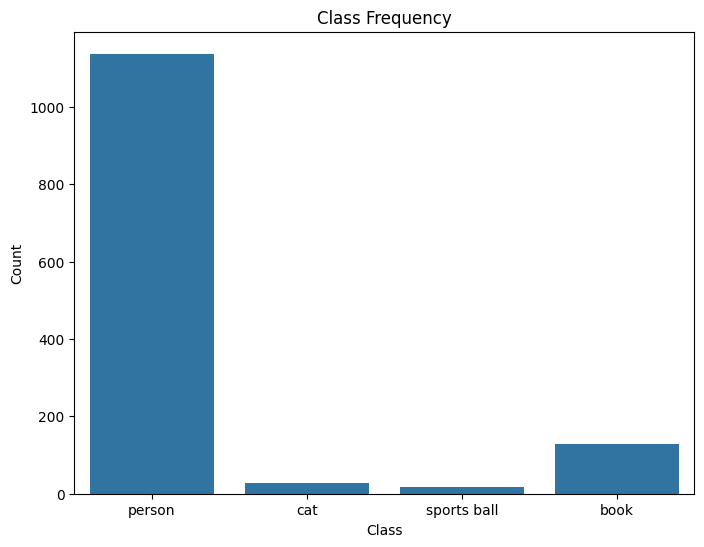

In [ ]:
plt.figure(figsize=(8,6))
sns.countplot(data=ann, x="category_id")
plt.xticks(ticks=range(len(target_cat_ids)), labels=target_classes)
plt.title("Class Frequency")
plt.xlabel("Class")
plt.ylabel("Count")
plt.show()


In [ ]:
# Install requirement
!pip install pycocotools --quiet

In [ ]:
# ============================================================
#  Helper: Load COCO JSON safely
# ============================================================

def load_coco(json_path):
    with open(json_path, "r") as f:
        coco = json.load(f)
    return coco

In [ ]:
BASE_DRIVE = "/content/drive/MyDrive/coco2019"   # typical Drive folder
DEFAULT_OUT = "/content/drive/MyDrive/coco2019/cleaned"   # where cleaned JSONs will be saved.

TRAIN_DIR = os.path.join(BASE_DRIVE, "train-300")
VAL_DIR   = os.path.join(BASE_DRIVE, "validation-300")
TEST_DIR  = os.path.join(BASE_DRIVE, "test-30")

TRAIN_JSON = os.path.join(TRAIN_DIR, "labels.json")
VAL_JSON   = os.path.join(VAL_DIR,   "labels.json")
TARGET_CLASSES = ["person", "book", "cat", "sports ball"]

In [ ]:
# =============================================================================
#  DATASET INITIALIZATION & CONFIGURATION
#  - Sets global parameters for image size, batch size, epochs, workers, GPU/CPU
#  - Loads cleaned COCO JSON annotations for train and validation sets
#  - Creates directories and verifies target classes
# =============================================================================

NUM_CLASSES = len(TARGET_CLASSES) + 1       # +1 for background class
IMAGE_SIZE = 800                            # Unified image size for training
BATCH_SIZE = 2
EPOCHS = 30
LR = 1e-4
NUM_WORKERS = 2
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

print("DEVICE:", DEVICE)
print("Expected target classes:", TARGET_CLASSES)
os.makedirs(DEFAULT_OUT, exist_ok=True)

# Load COCO-style JSON dictionaries
train_coco = load_coco(TRAIN_JSON)
val_coco = load_coco(VAL_JSON)

# -----------------------------------------------------------------------------
# Basic dataset statistics: image count, annotation count, category count
# -----------------------------------------------------------------------------
print("\nBasic counts (raw):")
print("Train images:", len(train_coco["images"]), "annotations:", len(train_coco["annotations"]))
print("Val   images:", len(val_coco["images"]), "annotations:", len(val_coco["annotations"]))
print("Categories:", len(train_coco.get("categories", [])))


# -----------------------------------------------------------------------------
# Category Mapping:
#  - Create ID Name and Name ID maps
#  - Verify whether chosen TARGET_CLASSES exist inside the dataset
# -----------------------------------------------------------------------------
catid2name = {c["id"]: c["name"] for c in train_coco.get("categories", [])}
name2catid = {v:k for k,v in catid2name.items()}

print("\nSample categories mapping (from train JSON):")
print({k:catid2name[k] for k in list(catid2name)[:10]})

missing_targets = [c for c in TARGET_CLASSES if c not in name2catid]
if missing_targets:
    print("Warning: these target classes not found in categories:", missing_targets)

target_coco_ids = [name2catid[c] for c in TARGET_CLASSES if c in name2catid]
print("Target COCO ids:", target_coco_ids)

# -----------------------------------------------------------------------------
# Image & Annotation Grouping:
#  - Build a lookup map for images
#  - Group all annotations per image_id for efficient dataloader operations
# -----------------------------------------------------------------------------
def build_maps(coco):
    imgs = {img["id"]: img for img in coco["images"]}
    ann_map = defaultdict(list)
    for a in coco["annotations"]:
        ann_map[a["image_id"]].append(a)
    return imgs, ann_map

train_imgs_map, train_ann_map = build_maps(train_coco)
val_imgs_map, val_ann_map = build_maps(val_coco)

# =============================================================================
#  EXPLORATORY DATA ANALYSIS (EDA)
#  - Shows class distribution
#  - Masks per image
#  - Bounding box & mask area statistics
#  - Detects invalid or zero-area bounding boxes
# =============================================================================

def eda_report(imgs_map, ann_map, name="train"):
    print(f"\nEDA for {name}:")
    counts = Counter()
    mask_counts = []
    bbox_areas = []
    mask_areas = []
    invalid_bbox_count = 0

    # Iterate over all annotations for this split
    for img_id, anns in ann_map.items():
        mask_counts.append(len(anns))

        for a in anns:
            cid = a["category_id"]
            counts[cid] += 1

            # Bounding box stats
            x, y, w, h = a.get("bbox", [0,0,0,0])
            if w <= 0 or h <= 0:
                invalid_bbox_count += 1
            bbox_areas.append(w * h)

            # Segmentation area (RLE or polygon)
            seg = a.get("segmentation", None)
            try:
                if isinstance(seg, dict) and "counts" in seg:
                    # RLE mask: decode with pycocotools
                    mask_areas.append(maskUtils.area(seg))
                else:
                    # Fallback: bbox area if mask missing
                    mask_areas.append(w * h)
            except:
                mask_areas.append(w * h)

    # Print class distribution and statistics
    print("Annotations per class (id -> count):")
    for cid, cnt in counts.most_common():
        print(f" {cid} ({catid2name.get(cid,'?')}): {cnt}")

    print("Avg masks per image:", np.mean(mask_counts),
          "min/max:", (min(mask_counts), max(mask_counts)))
    print("Avg bbox area:", np.mean(bbox_areas) if bbox_areas else 0,
          "invalid bbox count:", invalid_bbox_count)
    print("Mask area quartiles:",
          np.percentile(mask_areas, [0,25,50,75,100]) if mask_areas else None)

# Run EDA on train & validation sets
eda_report(train_imgs_map, train_ann_map, "train")
eda_report(val_imgs_map, val_ann_map, "val")


DEVICE: cuda
Expected target classes: ['person', 'book', 'cat', 'sports ball']

Basic counts (raw):
Train images: 300 annotations: 2715
Val   images: 300 annotations: 2686
Categories: 80

Sample categories mapping (from train JSON):
{1: 'person', 2: 'bicycle', 3: 'car', 4: 'motorcycle', 5: 'airplane', 6: 'bus', 7: 'train', 8: 'truck', 9: 'boat', 10: 'traffic light'}
Target COCO ids: [1, 84, 17, 37]

EDA for train:
Annotations per class (id -> count):
 1 (person): 1137
 84 (book): 128
 62 (chair): 112
 3 (car): 104
 47 (cup): 74
 44 (bottle): 68
 28 (umbrella): 59
 31 (handbag): 47
 67 (dining table): 46
 16 (bird): 44
 15 (bench): 41
 38 (kite): 38
 43 (tennis racket): 37
 51 (bowl): 35
 75 (remote): 29
 2 (bicycle): 28
 17 (cat): 27
 10 (traffic light): 27
 33 (suitcase): 25
 8 (truck): 23
 63 (couch): 22
 4 (motorcycle): 22
 19 (horse): 22
 41 (skateboard): 22
 27 (backpack): 21
 42 (surfboard): 21
 77 (cell phone): 20
 72 (tv): 19
 32 (tie): 18
 60 (donut): 18
 37 (sports ball): 18


In [ ]:
def ann_to_mask_clean(ann, H, W):
    seg = ann.get("segmentation", None)
    if seg is None:
        return None

    # -----------------------------
    # Case: Polygon segmentation ONLY
    # -----------------------------
    if isinstance(seg, list):

        # If segmentation is a flat list  wrap inside a list
        if len(seg) > 0 and isinstance(seg[0], (int, float)):
            seg = [seg]

        # Convert polygons → RLE → mask
        rles = maskUtils.frPyObjects(seg, H, W)

        # If multiple polygons, merge them
        if isinstance(rles, list):
            rles = maskUtils.merge(rles)

        # Decode to binary mask
        m = maskUtils.decode(rles)
        if m.ndim == 3:
            m = m[..., 0]

        return (m > 0).astype(np.uint8)

    return None



Detecting invalids in train...
Train invalid images: 0 invalid annotations: 1433

Detecting invalids in val...
Val invalid images: 0 invalid annotations: 1497
Saved cleaned JSON: /content/drive/MyDrive/coco2019/cleaned/train_cleaned_labels.json
Saved cleaned JSON: /content/drive/MyDrive/coco2019/cleaned/val_cleaned_labels.json

Sample images from cleaned train set:


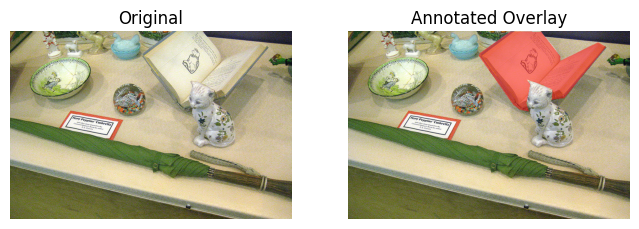

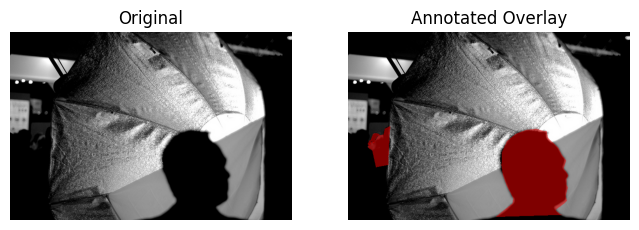

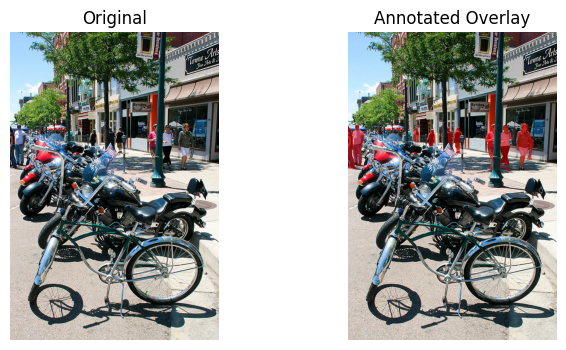

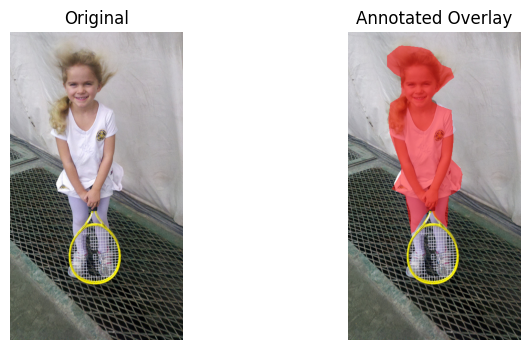


Dataset sizes after cleaning: train: 300 val: 300


In [ ]:
# ---------- Detect invalid images / annotations (comprehensive) ----------
def detect_invalids(imgs_map, ann_map, img_dir):
    invalid_images = []
    invalid_annotations = []
    missing_meta = []
    zero_size_images = []
    for img_id, info in imgs_map.items():
        img_path = os.path.join(img_dir, info.get("file_name", ""))
        # check file exists & openable
        if not os.path.exists(img_path):
            invalid_images.append(("missing_file", img_id, img_path))
            continue
        try:
            with Image.open(img_path) as im:
                im.verify()
        except Exception as e:
            invalid_images.append(("corrupt", img_id, img_path, str(e)))
            continue
        # check width/height
        if info.get("width",0) == 0 or info.get("height",0) == 0:
            missing_meta.append((img_id, img_path))
        # check annotations for this image
        anns = ann_map.get(img_id, [])
        for a in anns:
            # invalid category
            if a["category_id"] not in target_coco_ids:
                invalid_annotations.append(("cat_not_target", img_id, a["id"], a["category_id"]))
                continue
            # check mask decode
            m = ann_to_mask_clean(a, info.get("height", info.get("h",256)), info.get("width", info.get("w",256)))
            if m is None:
                invalid_annotations.append(("mask_fail", img_id, a["id"]))
                continue
            # zero-area mask?
            if m.sum() == 0:
                invalid_annotations.append(("empty_mask", img_id, a["id"]))
                continue
            # check bbox area
            x,y,w,h = a.get("bbox", [0,0,0,0])
            if w<=0 or h<=0:
                invalid_annotations.append(("zero_bbox", img_id, a["id"]))
    return {
        "invalid_images": invalid_images,
        "invalid_annotations": invalid_annotations,
        "missing_meta": missing_meta
    }

print("\nDetecting invalids in train...")
train_invalids = detect_invalids(train_imgs_map, train_ann_map, os.path.join(TRAIN_DIR, "data"))
print("Train invalid images:", len(train_invalids["invalid_images"]), "invalid annotations:", len(train_invalids["invalid_annotations"]))

print("\nDetecting invalids in val...")
val_invalids = detect_invalids(val_imgs_map, val_ann_map, os.path.join(VAL_DIR, "data"))
print("Val invalid images:", len(val_invalids["invalid_images"]), "invalid annotations:", len(val_invalids["invalid_annotations"]))


# ---------- Build cleaned JSONs: remove invalid annotations & images ----------
def build_cleaned_coco(orig_coco, imgs_map, ann_map, invalids, img_dir, out_json_path):
    # Copy structure
    cleaned = {}
    cleaned["info"] = orig_coco.get("info", {})
    cleaned["licenses"] = orig_coco.get("licenses", [])
    cleaned["images"] = []
    cleaned["annotations"] = []
    cleaned["categories"] = orig_coco.get("categories", [])

    invalid_img_ids = set([item[1] for item in invalids["invalid_images"]])
    invalid_ann_ids = set([item[2] for item in invalids["invalid_annotations"] if len(item)>=3])
    # We also remove annotations for categories not in target set (if user wants only subset)
    allowed_cat_ids = set(target_coco_ids)

    ann_id = 1
    for img in orig_coco["images"]:
        img_id = img["id"]
        if img_id in invalid_img_ids:
            continue
        # include image
        cleaned["images"].append(img)
        # include annotations for this image that are valid and belong to allowed classes
        for a in ann_map.get(img_id, []):
            if a["id"] in invalid_ann_ids:
                continue
            if a["category_id"] not in allowed_cat_ids:
                continue
            # final sanity: can we decode mask?
            m = ann_to_mask_clean(a, img.get("height",256), img.get("width",256))
            if m is None or m.sum() == 0:
                continue
            # keep annotation (preserve original id)
            cleaned["annotations"].append(a)

    # save cleaned json
    with open(out_json_path, "w") as f:
        json.dump(cleaned, f)
    print("Saved cleaned JSON:", out_json_path)
    return cleaned

# create cleaned outputs
train_out = os.path.join(DEFAULT_OUT, "train_cleaned_labels.json")
val_out   = os.path.join(DEFAULT_OUT, "val_cleaned_labels.json")

train_clean = build_cleaned_coco(train_coco, train_imgs_map, train_ann_map, train_invalids, os.path.join(TRAIN_DIR,"data"), train_out)
val_clean   = build_cleaned_coco(val_coco, val_imgs_map, val_ann_map, val_invalids, os.path.join(VAL_DIR,"data"), val_out)


# ---------- EDA Visual: show sample images with masks (from cleaned) ----------
def show_sample_with_masks(coco, img_dir, n=6):
    images = coco["images"]
    anns = coco["annotations"]
    ann_map = defaultdict(list)
    for a in anns:
        ann_map[a["image_id"]].append(a)
    samples = random.sample(images, min(n, len(images)))
    for img in samples:
        img_path = os.path.join(img_dir, img["file_name"])
        if not os.path.exists(img_path):
            continue
        im = Image.open(img_path).convert("RGB")
        arr = np.array(im)
        overlay = arr.copy()
        for a in ann_map[img["id"]]:
            m = ann_to_mask_clean(a, img.get("height", im.height), img.get("width", im.width))
            if m is None: continue
            mask = Image.fromarray((m*255).astype(np.uint8)).resize((im.width, im.height), Image.NEAREST)
            mask_arr = np.array(mask) > 0
            color = np.array([255,0,0])
            overlay[mask_arr] = (overlay[mask_arr] * 0.5 + color*0.5).astype(np.uint8)
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1); plt.imshow(arr); plt.title("Original"); plt.axis("off")
        plt.subplot(1,2,2); plt.imshow(overlay); plt.title("Annotated Overlay"); plt.axis("off")
        plt.show()

print("\nSample images from cleaned train set:")
show_sample_with_masks(train_clean, os.path.join(TRAIN_DIR, "data"), n=4)


# ---------- Prepare robust Mask R-CNN dataset (crash-proof) ----------
class RobustMaskRCNNDataset(Dataset):
    def __init__(self, coco_json_path, img_dir, target_cats=target_coco_ids, image_size=IMAGE_SIZE):
        with open(coco_json_path,"r") as f:
            coco = json.load(f)
        self.images = {img["id"]: img for img in coco["images"]}
        self.ann_map = defaultdict(list)
        for a in coco["annotations"]:
            if a["category_id"] in target_cats:
                self.ann_map[a["image_id"]].append(a)
        self.ids = sorted(list(self.ann_map.keys()))
        self.img_dir = img_dir
        self.cat2label = {cid: i+1 for i, cid in enumerate(target_cats)}
        self.image_size = image_size
        self.tf = transforms.Compose([
            transforms.Resize((image_size, image_size)),
            transforms.ToTensor()
        ])

    def __len__(self): return len(self.ids)

    def __getitem__(self, idx):
        img_id = self.ids[idx]
        info = self.images[img_id]
        img_path = os.path.join(self.img_dir, info["file_name"])
        img = Image.open(img_path).convert("RGB")
        W0, H0 = img.size

        boxes, labels, masks = [], [], []

        for a in self.ann_map[img_id]:
            # ensure category still valid
            if a["category_id"] not in self.cat2label:
                continue
            # bbox scaling (resized coords)
            x,y,w,h = a.get("bbox", [0,0,0,0])
            if w<=0 or h<=0:
                continue
            x1 = x / W0 * self.image_size
            y1 = y / H0 * self.image_size
            x2 = (x + w) / W0 * self.image_size
            y2 = (y + h) / H0 * self.image_size

            # mask
            m0 = ann_to_mask_clean(a, H0, W0)
            if m0 is None or m0.sum() == 0:
                continue
            m_rs = Image.fromarray((m0*255).astype(np.uint8)).resize((self.image_size, self.image_size), Image.NEAREST)
            m_arr = np.array(m_rs) > 0
            if m_arr.shape != (self.image_size, self.image_size):
                continue

            boxes.append([x1,y1,x2,y2])
            labels.append(self.cat2label[a["category_id"]])
            masks.append(m_arr.astype(np.uint8))

        # If no valid anns, create empty target (Mask R-CNN can handle images without anns too)
        if len(boxes) == 0:
            boxes = torch.zeros((0,4), dtype=torch.float32)
            labels = torch.zeros((0,), dtype=torch.int64)
            masks = torch.zeros((0, self.image_size, self.image_size), dtype=torch.uint8)
        else:
            boxes = torch.tensor(boxes, dtype=torch.float32)
            labels = torch.tensor(labels, dtype=torch.int64)
            masks = torch.tensor(np.stack(masks, axis=0), dtype=torch.uint8)

        target = {"boxes": boxes, "labels": labels, "masks": masks, "image_id": torch.tensor([img_id])}
        return self.tf(img), target

# ---------- Build datasets & dataloaders ----------
train_ds = RobustMaskRCNNDataset(train_out, os.path.join(TRAIN_DIR,"data"))
val_ds   = RobustMaskRCNNDataset(val_out,   os.path.join(VAL_DIR,"data"))

# If GPU missing and user wants quick CPU test, reduce dataset
if DEVICE == "cpu" and CPU_QUICK_MODE:
    print("CPU quick mode ON: sampling small subset to run fast on CPU.")
    train_ds.ids = train_ds.ids[:20]
    val_ds.ids = val_ds.ids[:10]
    EPOCHS = 1

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, collate_fn=lambda x: tuple(zip(*x)),
                          num_workers=NUM_WORKERS, pin_memory=(DEVICE!="cpu"))
val_loader = DataLoader(val_ds, batch_size=1, shuffle=False, collate_fn=lambda x: tuple(zip(*x)),
                        num_workers=NUM_WORKERS, pin_memory=(DEVICE!="cpu"))

print("\nDataset sizes after cleaning: train:", len(train_ds), "val:", len(val_ds))


In [ ]:
# ----------- GLOBAL TRAINING CONFIG -----------

IMAGE_SIZE = 800      # Input image size (recommended)
BATCH_SIZE = 4        # Adjust if GPU memory is small → use 2
LR = 0.0005           # Stable learning rate for Mask R-CNN
EPOCHS = 40          # You requested 40 epochs
NUM_WORKERS = 2       # Works well on Colab


In [ ]:
# ---------- Build Mask R-CNN model ----------
def build_model(num_classes):
    # Load pretrained Mask R-CNN (ResNet-50 + FPN)
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights="DEFAULT")

    # Replace classification head
    in_feats = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(
        in_feats, num_classes
    )

    # Replace mask head
    in_feats_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
    model.roi_heads.mask_predictor = torchvision.models.detection.mask_rcnn.MaskRCNNPredictor(
        in_feats_mask, 256, num_classes
    )

    return model


# Build model
model = build_model(NUM_CLASSES)
model.to(DEVICE)

optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-4)
scaler = torch.cuda.amp.GradScaler() if DEVICE.startswith("cuda") else None


def masks_to_semantic(masks, labels, image_size):
    sem = np.zeros((image_size, image_size), dtype=np.int32)
    for i in range(masks.shape[0]):
        sem[masks[i] > 0.5] = int(labels[i])
    return sem


EPOCHS = 40
best_miou = 0.0
history = {"loss": [], "miou": []}

print("\n Training Started (40 epochs)\n")

for epoch in range(1, EPOCHS + 1):
    t0 = time.time()
    model.train()

    total_loss = 0.0
    steps = 0

    # ---------------- TRAINING ----------------
    for imgs, targets in train_loader:

        imgs = [img.to(DEVICE) for img in imgs]

        # Move targets to device
        targets_dev = []
        for t in targets:
            td = {}
            for k, v in t.items():
                td[k] = v.to(DEVICE) if torch.is_tensor(v) else v
            targets_dev.append(td)

        optimizer.zero_grad()

        # AMP Mixed precision
        if DEVICE.startswith("cuda"):
            with torch.cuda.amp.autocast():
                loss_dict = model(imgs, targets_dev)
                loss = sum(loss_dict.values())

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

        else:
            loss_dict = model(imgs, targets_dev)
            loss = sum(loss_dict.values())
            loss.backward()
            optimizer.step()

        total_loss += loss.item()
        steps += 1

    avg_loss = total_loss / max(1, steps)
    history["loss"].append(avg_loss)

    # ---------------- VALIDATION mIoU ----------------
    model.eval()
    cm = np.zeros((NUM_CLASSES, NUM_CLASSES), dtype=np.int64)

    with torch.no_grad():
        for imgs, targets in val_loader:

            img = imgs[0].to(DEVICE)
            out = model([img])[0]

            # Pred semantic
            if "masks" in out and len(out["masks"]) > 0:
                pred_masks = (out["masks"] > 0.5).squeeze(1).cpu().numpy()
                pred_labels = out["labels"].cpu().numpy()
                pred_sem = masks_to_semantic(pred_masks, pred_labels, IMAGE_SIZE)
            else:
                pred_sem = np.zeros((IMAGE_SIZE, IMAGE_SIZE), dtype=np.int32)

            # GT semantic
            gt = targets[0]
            if gt["masks"].shape[0] > 0:
                true_masks = gt["masks"].cpu().numpy()
                true_labels = gt["labels"].cpu().numpy()
                true_sem = masks_to_semantic(true_masks, true_labels, IMAGE_SIZE)
            else:
                true_sem = np.zeros((IMAGE_SIZE, IMAGE_SIZE), dtype=np.int32)

            valid = (true_sem >= 0) & (true_sem < NUM_CLASSES)
            combined = NUM_CLASSES * true_sem[valid] + pred_sem[valid]
            hist = np.bincount(combined, minlength=NUM_CLASSES * NUM_CLASSES).reshape(NUM_CLASSES, NUM_CLASSES)
            cm += hist

    tp = np.diag(cm).astype(float)
    fp = cm.sum(axis=0) - tp
    fn = cm.sum(axis=1) - tp
    union = tp + fp + fn
    iou = tp / (union + 1e-9)
    miou = float(np.nanmean(iou))
    history["miou"].append(miou)

    epoch_time = time.time() - t0

    print(f"Epoch {epoch:02d}/{EPOCHS} | Loss: {avg_loss:.4f} | mIoU: {miou:.4f} | Time: {epoch_time:.1f}s")

    # --------------- Save Best Model ---------------
    if miou > best_miou:
        best_miou = miou
        ckpt = os.path.join(DEFAULT_OUT, "maskrcnn_best.pth")
        torch.save({"model": model.state_dict(), "miou": miou, "epoch": epoch},ckpt)

print(f" Updated best model  {ckpt}")


print("\n Training Finished!")
print(" BEST mIoU:", best_miou)



 Training Started (5 epochs)



/tmp/ipython-input-1179990437.py:26: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler() if DEVICE.startswith("cuda") else None
/tmp/ipython-input-1179990437.py:66: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():


Epoch 01/40 | Loss: 1.4104 | mIoU: 0.0640 | Time: 120.6s
Epoch 02/40 | Loss: 1.1710 | mIoU: 0.1158 | Time: 119.8s
Epoch 03/40 | Loss: 1.1140 | mIoU: 0.1290 | Time: 93.8s
Epoch 04/40 | Loss: 1.0599 | mIoU: 0.1313 | Time: 93.7s
Epoch 05/40 | Loss: 1.0529 | mIoU: 0.1957 | Time: 91.1s
Epoch 06/40 | Loss: 1.0111 | mIoU: 0.1431 | Time: 124.3s
Epoch 07/40 | Loss: 0.9767 | mIoU: 0.1896 | Time: 113.1s
Epoch 08/40 | Loss: 0.9477 | mIoU: 0.1715 | Time: 98.3s
Epoch 09/40 | Loss: 0.8959 | mIoU: 0.1970 | Time: 93.8s
Epoch 10/40 | Loss: 0.8824 | mIoU: 0.2094 | Time: 92.7s
Epoch 11/40 | Loss: 0.8383 | mIoU: 0.1929 | Time: 121.1s
Epoch 12/40 | Loss: 0.8221 | mIoU: 0.2484 | Time: 89.6s
Epoch 13/40 | Loss: 0.7928 | mIoU: 0.1750 | Time: 113.5s
Epoch 14/40 | Loss: 0.7556 | mIoU: 0.2237 | Time: 95.9s
Epoch 15/40 | Loss: 0.7236 | mIoU: 0.2333 | Time: 88.8s
Epoch 16/40 | Loss: 0.6967 | mIoU: 0.2103 | Time: 96.5s
Epoch 17/40 | Loss: 0.6777 | mIoU: 0.2039 | Time: 89.4s
Epoch 18/40 | Loss: 0.6333 | mIoU: 0.2074 

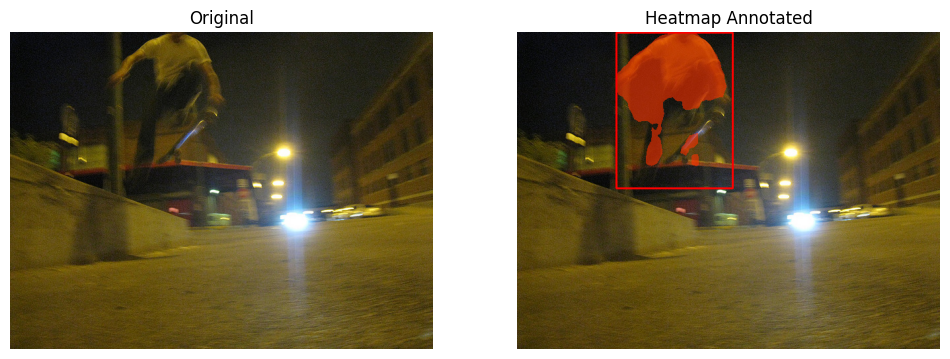

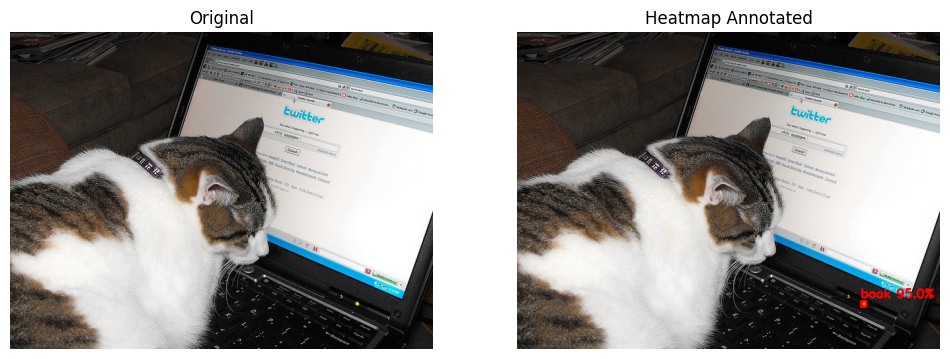

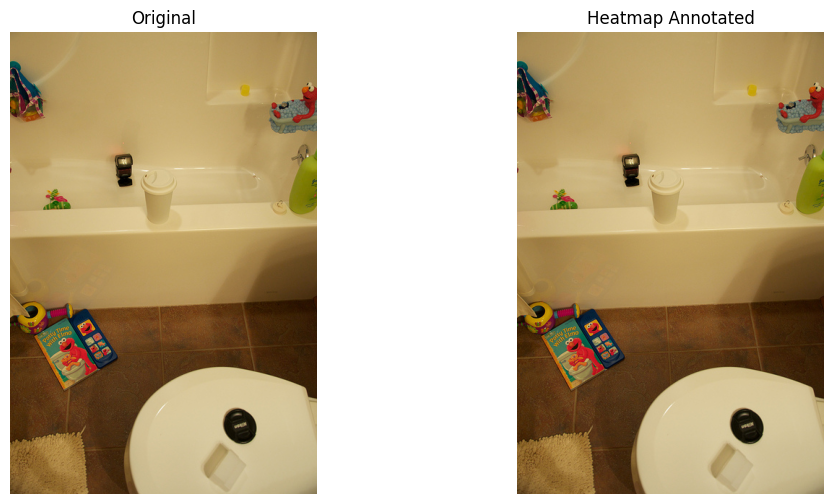

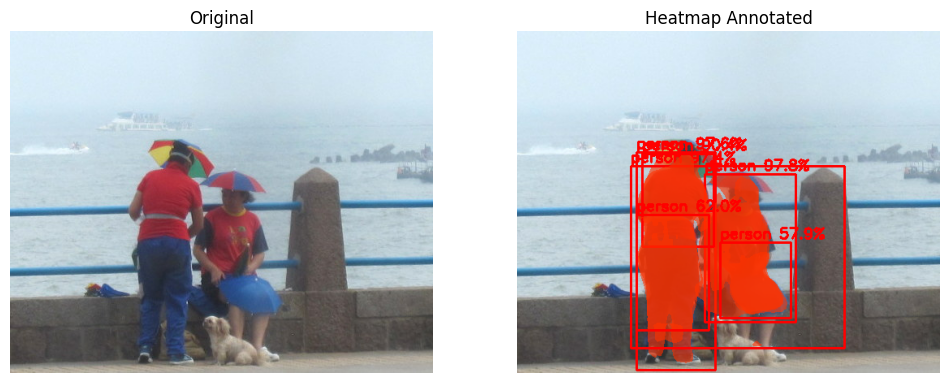

In [ ]:
# ===============================================================
# VISUALIZE: Heatmap Mask + BBox + Label + Score
# ===============================================================
import cv2
import numpy as np
import matplotlib.pyplot as plt

def visualize_predictions_heatmap(model, dataset, device="cuda", score_thresh=0.5, n=6):
    model.eval()
    ids = random.sample(dataset.ids, min(n, len(dataset)))

    inv_map = {v:k for k,v in dataset.cat2label.items()}
    coco_cat_names = {1:"person", 2:"cat", 3:"sports ball", 4:"book"}

    for img_id in ids:
        img_info = dataset.images[img_id]
        img_path = os.path.join(dataset.img_dir, img_info["file_name"])
        im = Image.open(img_path).convert("RGB")
        im_arr = np.array(im)
        H0, W0 = im_arr.shape[:2]

        # preprocess
        tf_img = dataset.tf(im)
        with torch.no_grad():
            pred = model([tf_img.to(device)])[0]

        boxes = pred["boxes"].cpu().numpy()
        labels = pred["labels"].cpu().numpy()
        scores = pred["scores"].cpu().numpy()
        masks = pred["masks"].cpu().numpy()

        overlay = im_arr.copy()
        heat_color = np.array([255, 50, 0], dtype=np.uint8)

        for i, score in enumerate(scores):
            if score < score_thresh:
                continue

            # Resize mask BACK to original image size
            mask = masks[i, 0]
            mask = (cv2.resize(mask, (W0, H0)) > 0.5)

            label_id = labels[i]
            name = coco_cat_names.get(label_id, "object")

            # Apply heat overlay only where mask is True
            overlay[mask] = overlay[mask] * 0.4 + heat_color * 0.6

            # Draw bounding box (convert from resized coordinate)
            # Convert bbox back to original image scale:
            x1,y1,x2,y2 = boxes[i]

            # boxes were predicted on 800x800, rescale to original size
            x1 = int(x1 / dataset.image_size * W0)
            y1 = int(y1 / dataset.image_size * H0)
            x2 = int(x2 / dataset.image_size * W0)
            y2 = int(y2 / dataset.image_size * H0)

            cv2.rectangle(overlay, (x1,y1), (x2,y2), (255,0,0), 2)
            text = f"{name} {score*100:.1f}%"
            cv2.putText(overlay, text, (x1, y1-5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,0,0), 2)

        plt.figure(figsize=(12,6))
        plt.subplot(1,2,1)
        plt.imshow(im_arr)
        plt.title("Original")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(overlay)
        plt.title("Heatmap Annotated")
        plt.axis("off")

        plt.show()


visualize_predictions_heatmap(model, val_ds, device=DEVICE, score_thresh=0.5, n=4)


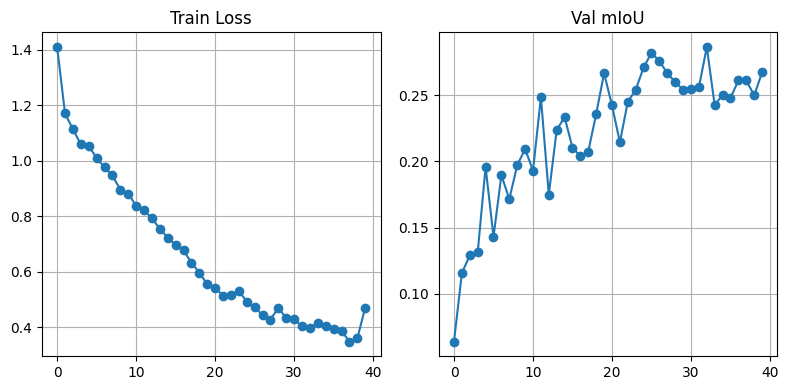

In [ ]:
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
plt.plot(history["loss"], marker='o')
plt.title("Train Loss"); plt.grid(True)

plt.subplot(1,2,2)
plt.plot(history["miou"], marker='o')
plt.title("Val mIoU"); plt.grid(True)

plt.tight_layout()
plt.show()


In [ ]:
def random_colors(n, seed=42):
    random.seed(seed)
    return [tuple(np.random.randint(0,255,3).tolist()) for _ in range(n)]


def show_maskrcnn_prediction(image_path, model, score_threshold=0.25, max_instances=30):

    model.eval()
    img = Image.open(image_path).convert("RGB")
    orig_np = np.array(img)
    H, W = orig_np.shape[:2]

    tf = transforms.Compose([
        transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
        transforms.ToTensor()
    ])
    inp = tf(img).to(DEVICE)

    with torch.no_grad():
        out = model([inp])[0]

    boxes = out.get("boxes", torch.zeros((0,4))).cpu().numpy()
    labels = out.get("labels", torch.zeros((0,))).cpu().numpy()
    scores = out.get("scores", torch.zeros((0,))).cpu().numpy()
    masks = out.get("masks", torch.zeros((0,1,IMAGE_SIZE,IMAGE_SIZE))).cpu().numpy()

    canvas = orig_np.copy()
    colors = random_colors(len(boxes))
    inst = 0

    for i in range(len(boxes)):

        if scores[i] < score_threshold: continue
        if inst >= max_instances: break

        mask_small = masks[i, 0]
        mask_img = Image.fromarray((mask_small * 255).astype(np.uint8))
        mask_img = mask_img.resize((W, H), resample=Image.NEAREST)
        mask_bool = np.array(mask_img) > 0

        color = np.array(colors[inst])
        canvas[mask_bool] = (canvas[mask_bool] * 0.5 + color * 0.5).astype(np.uint8)

        x1, y1, x2, y2 = boxes[i]
        x1 = int(x1 * W / IMAGE_SIZE); x2 = int(x2 * W / IMAGE_SIZE)
        y1 = int(y1 * H / IMAGE_SIZE); y2 = int(y2 * H / IMAGE_SIZE)

        canvas_pil = Image.fromarray(canvas)
        draw = ImageDraw.Draw(canvas_pil)

        lbl_idx = int(labels[i])
        lbl_name = TARGET_CLASSES[lbl_idx - 1]

        draw.rectangle([x1, y1, x2, y2], outline=(255,0,0), width=3)
        draw.text((x1+4, max(0, y1-18)), f"{lbl_name}:{scores[i]:.2f}", fill=(255,255,0))

        canvas = np.array(canvas_pil)
        inst += 1

    plt.figure(figsize=(8,8))
    plt.imshow(canvas)
    plt.axis("off")
    plt.title(os.path.basename(image_path))
    plt.show()


In [ ]:
# ===============================
# Load test image file names
# ==============================
import os

TEST_DIR = "/content/drive/MyDrive/coco2019/test-30"    # <-- Make sure this path is correct

test_files = sorted([
    f for f in os.listdir(TEST_DIR)
    if f.lower().endswith((".jpg", ".jpeg", ".png"))
])[:10]   # take first 10 (or remove [:10] to load all)

print("Test files:", test_files)


Test files: ['000000013177.jpg', '000000013291.jpg', '000000050380.jpg', '000000066771.jpg', '000000079969.jpg', '000000117525.jpg', '000000125850.jpg', '000000143556.jpg', '000000153011.jpg', '000000156292.jpg']


In [ ]:
import torch
import torchvision

CKPT = "/content/drive/MyDrive/coco2019/cleaned/maskrcnn_best.pth"
NUM_CLASSES = 5

# ---------------------------------------------------------------
# Recreate SAME model architecture used during training
# ---------------------------------------------------------------
def build_model(num_classes):
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights=None)

    # Classification head
    in_feats = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(
        in_feats, num_classes
    )

    # Mask head
    in_mask_feats = model.roi_heads.mask_predictor.conv5_mask.in_channels
    model.roi_heads.mask_predictor = torchvision.models.detection.mask_rcnn.MaskRCNNPredictor(
        in_mask_feats, 256, num_classes
    )

    return model

# Create model
model = build_model(NUM_CLASSES)

# ---------------------------------------------------------------
# Load trained weights
# ---------------------------------------------------------------
ckpt = torch.load(CKPT, map_location="cpu")
model.load_state_dict(ckpt["model"])

print("Loaded Mask R-CNN checkpoint successfully!")
print("Epoch:", ckpt["epoch"])
print("Best mIoU:", ckpt["miou"])


Loaded Mask R-CNN checkpoint successfully!
Epoch: 33
Best mIoU: 0.2862274110757189


In [ ]:
import numpy as np
import torch
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import torchvision.transforms as T
import random
import os

# ---------------------------------------------------------
# SETTINGS
# ---------------------------------------------------------
IMAGE_SIZE = 800
TARGET_CLASSES = ["person", "book", "cat", "sports ball"]
TEST_DIR = "/content/drive/MyDrive/coco2019/test-30"
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

model.to(DEVICE)
model.eval()

# ---------------------------------------------------------
# COLOR GENERATOR
# ---------------------------------------------------------
def random_colors(N, seed=123):
    random.seed(seed)
    return [tuple(random.randint(0,255) for _ in range(3)) for _ in range(N)]
def show_maskrcnn_prediction(image_path, model, score_threshold=0.10):

    print("\n=== Processing:", os.path.basename(image_path), "===")

    # Load image
    img_pil = Image.open(image_path).convert("RGB")
    W, H = img_pil.size
    print("Original size:", (W, H))

    canvas = np.array(img_pil).copy()

    # Preprocess
    transform = T.Compose([
        T.Resize((IMAGE_SIZE, IMAGE_SIZE)),
        T.ToTensor()
    ])
    inp = transform(img_pil).to(DEVICE)

    model.eval()
    with torch.no_grad():
        out = model([inp])[0]

    boxes = out["boxes"].cpu().numpy()
    labels = out["labels"].cpu().numpy()
    scores = out["scores"].cpu().numpy()
    masks = out["masks"].cpu().numpy()[:,0]

    print("Detections:", len(boxes))
    print("Scores:", scores[:10])

    # Prepare colors
    colors = random_colors(len(boxes))

    # Scale factors
    sx = W / IMAGE_SIZE
    sy = H / IMAGE_SIZE

    draw_pil = img_pil.copy()
    drawer = ImageDraw.Draw(draw_pil)

    for i in range(len(boxes)):
        if scores[i] < score_threshold:
            continue

        # ---------- Box ----------
        x1,y1,x2,y2 = boxes[i]
        x1 = int(x1 * sx); x2 = int(x2 * sx)
        y1 = int(y1 * sy); y2 = int(y2 * sy)

        lbl = int(labels[i])

        # ---------- Class Name ----------
        if 1 <= lbl <= len(TARGET_CLASSES):
            label_name = TARGET_CLASSES[lbl - 1]
        else:
            label_name = "unknown"

        score_txt = f"{label_name} ({scores[i]:.2f})"

        # ---------- Mask ----------
        mask_small = masks[i] > 0.5
        mask_big = Image.fromarray((mask_small.astype(np.uint8) * 255))
        mask_big = mask_big.resize((W, H), Image.NEAREST)
        mask_big = np.array(mask_big) > 0

        color = np.array(colors[i])
        canvas[mask_big] = (canvas[mask_big] * 0.4 + color * 0.6).astype(np.uint8)

        # ---------- Draw box + label ----------
        drawer.rectangle([x1, y1, x2, y2], outline=(255,0,0), width=3)
        drawer.text((x1 + 5, y1 + 5), score_txt, fill=(255,255,0))

    # Combine mask overlay & box layer
    final = (0.5 * np.array(draw_pil) + 0.5 * canvas).astype(np.uint8)

    plt.figure(figsize=(10,10))
    plt.imshow(final)
    plt.axis("off")
    plt.show()


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
import torchvision.transforms as T
import torch
import os

def random_colors(N, seed=123):
    np.random.seed(seed)
    return [tuple(np.random.randint(0,255,3).tolist()) for _ in range(N)]


def show_maskrcnn_prediction_contour(
        image_path,
        model,
        score_threshold=0.25,
        max_instances=30
    ):

    print("\n=== Processing:", os.path.basename(image_path), "===")

    # ---- Load image ----
    img_pil = Image.open(image_path).convert("RGB")
    W, H = img_pil.size
    orig = np.array(img_pil)

    # ---- Preprocess ----
    transform = T.Compose([
        T.Resize((IMAGE_SIZE, IMAGE_SIZE)),
        T.ToTensor()
    ])
    img_t = transform(img_pil).to(DEVICE)

    # ---- Inference ----
    model.eval()
    with torch.no_grad():
        out = model([img_t])[0]

    boxes  = out["boxes"].cpu().numpy()
    labels = out["labels"].cpu().numpy()
    scores = out["scores"].cpu().numpy()
    masks  = out["masks"].cpu().numpy()[:,0]

    # scale factors
    sx = W / IMAGE_SIZE
    sy = H / IMAGE_SIZE

    result = orig.copy()

    # PIL draw object for text
    result_pil = Image.fromarray(result)
    draw = ImageDraw.Draw(result_pil)

    # font
    try:
        font = ImageFont.truetype("DejaVuSans-Bold.ttf", 22)
    except:
        font = ImageFont.load_default()

    # random colors
    colors = random_colors(len(boxes))

    inst = 0
    for i in range(len(boxes)):
        if scores[i] < score_threshold:
            continue
        if inst >= max_instances:
            break

        # ===== Resize mask back =====
        m_small = masks[i] > 0.5
        mask_img = Image.fromarray((m_small.astype(np.uint8)*255))
        mask_big = mask_img.resize((W,H), Image.NEAREST)
        mask_big = np.array(mask_big) > 0

        # ===== Color overlay =====
        color = np.array(colors[i], dtype=np.uint8)
        result[mask_big] = (0.6 * result[mask_big] + 0.4 * color).astype(np.uint8)

        # ===== Draw contour =====

        alpha = 8   # lower this → more transparent
        result[mask_big] = (result[mask_big] * (1 - alpha) + color * alpha).astype(np.uint8)

        mask_uint8 = (mask_big.astype(np.uint8) * 255)
        contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        for cnt in contours:
            cv2.drawContours(result, [cnt], -1, color.tolist(), 2)



        # ===== LABEL TEXT (center of mask) =====
        ys, xs = np.where(mask_big)
        if len(xs) > 0:
            cx = int(xs.mean())
            cy = int(ys.mean())
        else:
            cx, cy = 10, 10

        lbl = int(labels[i])
        cname = TARGET_CLASSES[lbl - 1]
        txt = f"{cname} {scores[i]:.2f}"

        # BLACK OUTLINE for bold effect
        for ox in [-2,-1,0,1,2]:
            for oy in [-2,-1,0,1,2]:
                draw.text((cx+ox, cy+oy), txt, fill=(0,0,0), font=font)

        # RED text
        draw.text((cx, cy), txt, fill=(255,0,0), font=font)

        inst += 1

    final = np.array(result_pil)

    plt.figure(figsize=(12, 8))
    plt.imshow(final)
    plt.axis("off")
    plt.title("Mask + Contour + Center Label")
    plt.show()



=== Processing: 000000013177.jpg ===
Original size: (640, 427)
Detections: 17
Scores: [0.9951609  0.7085883  0.7060214  0.41740498 0.41100553 0.34447438
 0.2588819  0.24591321 0.2133107  0.18713795]


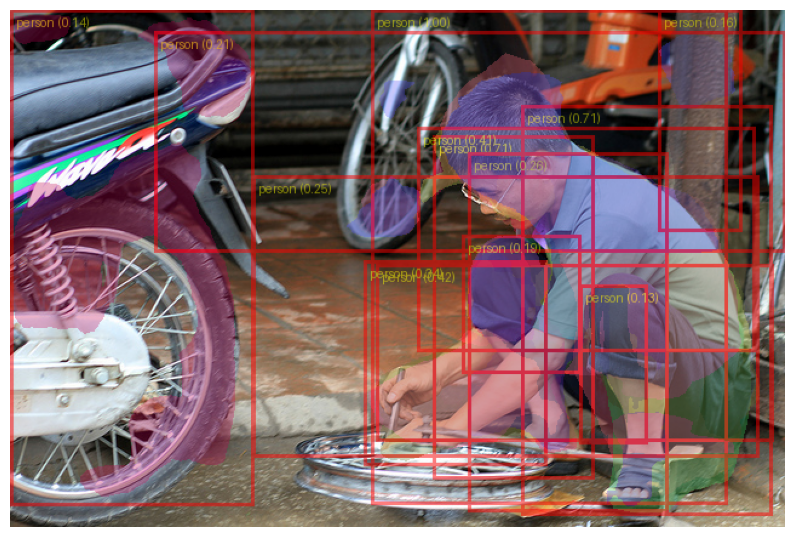


=== Processing: 000000013291.jpg ===
Original size: (500, 335)
Detections: 17
Scores: [0.9941105  0.9738877  0.9699026  0.88680756 0.837007   0.79328704
 0.74730974 0.579055   0.54248554 0.4906546 ]


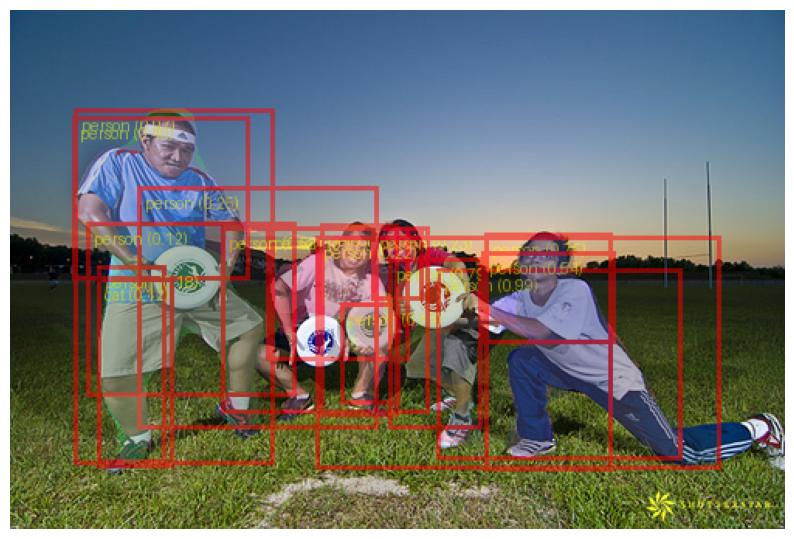


=== Processing: 000000050380.jpg ===
Original size: (640, 427)
Detections: 16
Scores: [0.9983103  0.9790237  0.953258   0.9274648  0.8388028  0.6791227
 0.46352458 0.4231446  0.32737646 0.13244201]


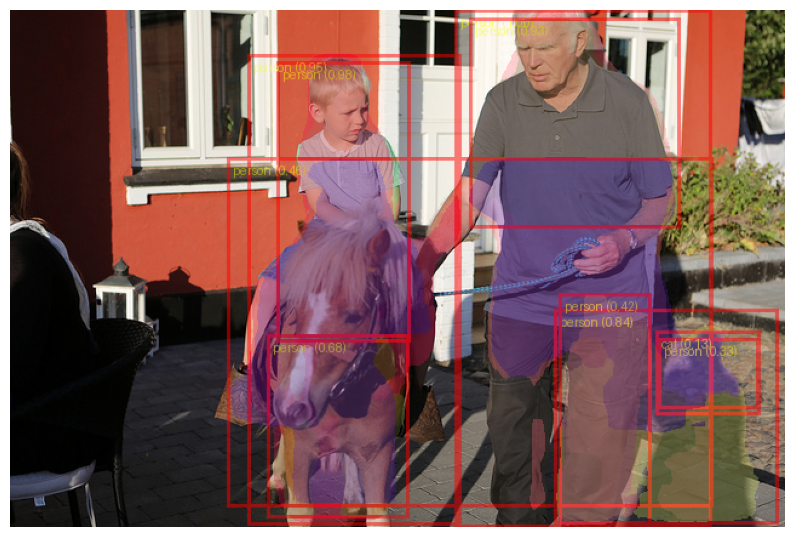


=== Processing: 000000066771.jpg ===
Original size: (640, 480)
Detections: 14
Scores: [0.9862882  0.96266854 0.9244652  0.40555075 0.40322524 0.22993891
 0.2267214  0.21009964 0.17664205 0.13377075]


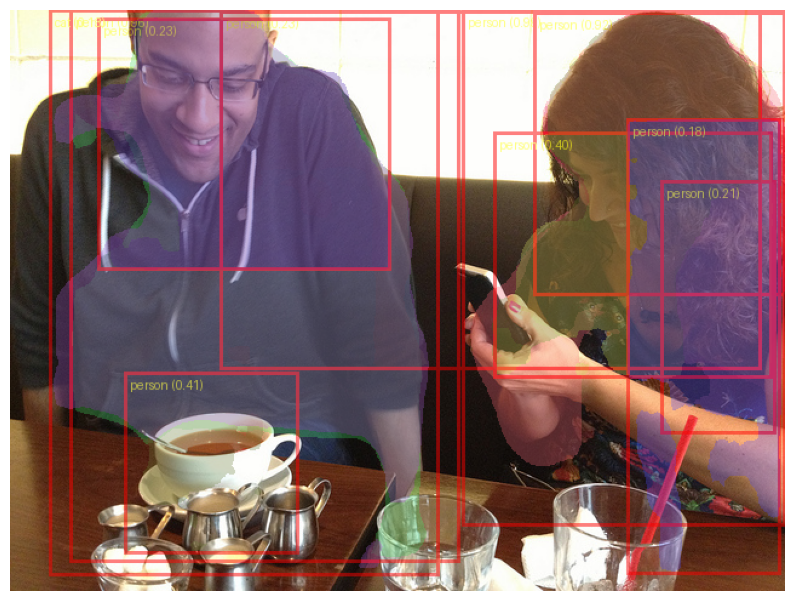


=== Processing: 000000079969.jpg ===
Original size: (426, 640)
Detections: 73
Scores: [0.99789387 0.99349797 0.9929919  0.99147743 0.99040526 0.9873849
 0.9797901  0.97714144 0.974496   0.965705  ]


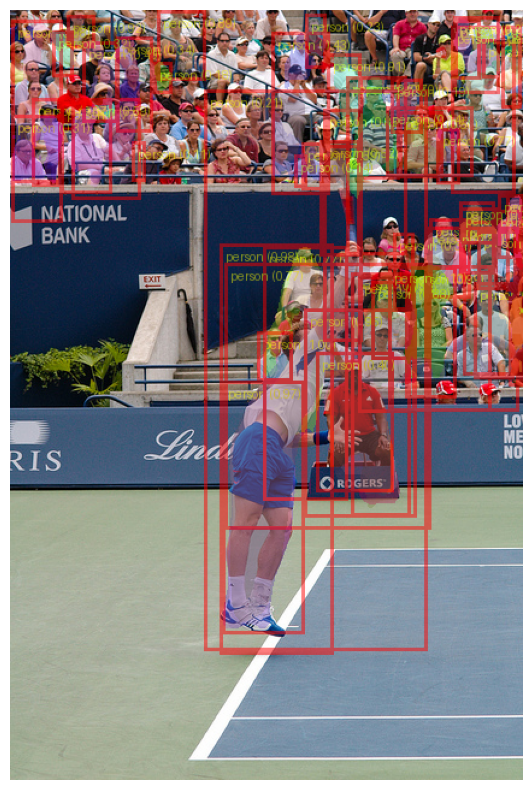


=== Processing: 000000117525.jpg ===
Original size: (500, 500)
Detections: 8
Scores: [0.99406636 0.9243606  0.19589682 0.1412698  0.10276132 0.09553663
 0.08959277 0.05106808]


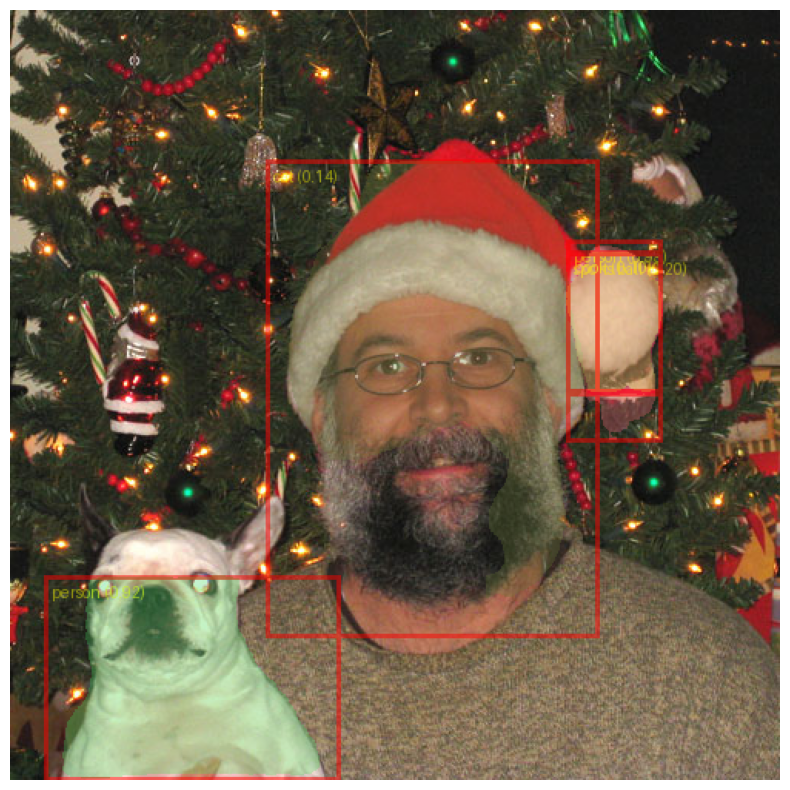


=== Processing: 000000125850.jpg ===
Original size: (640, 489)
Detections: 11
Scores: [0.63266414 0.32659987 0.2555475  0.13073894 0.12161275 0.09945899
 0.07933851 0.07412365 0.06032039 0.05558338]


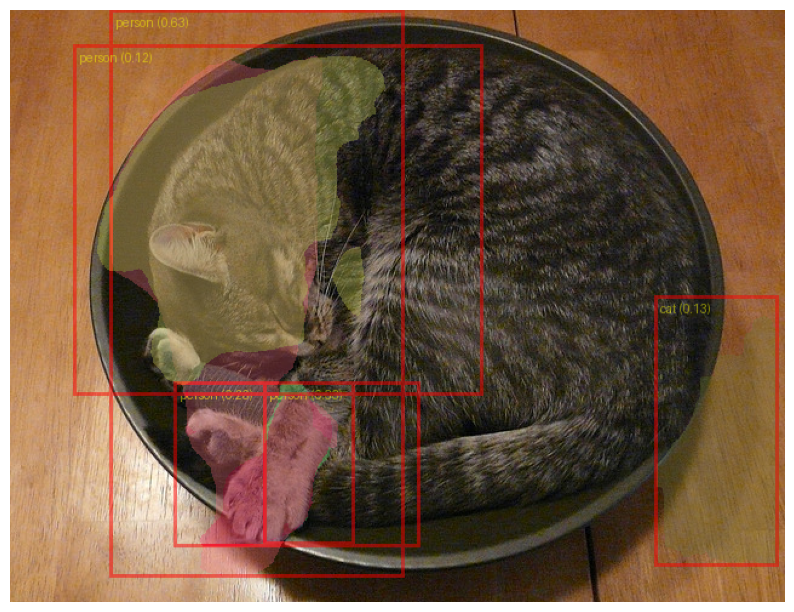


=== Processing: 000000143556.jpg ===
Original size: (480, 640)
Detections: 10
Scores: [0.8154516  0.5664168  0.23511626 0.2175148  0.16217764 0.16210623
 0.16084671 0.09536277 0.0715475  0.05903343]


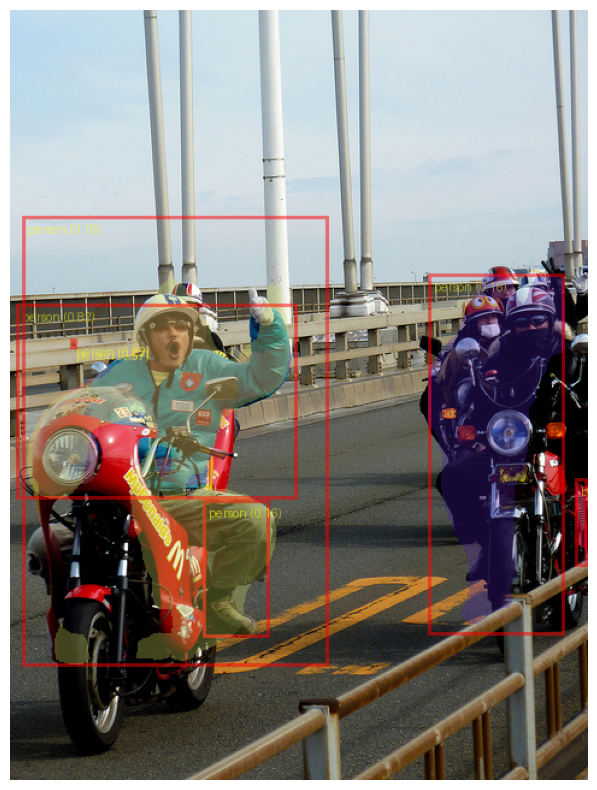


=== Processing: 000000153011.jpg ===
Original size: (640, 480)
Detections: 19
Scores: [0.9989102  0.9915005  0.9860199  0.9721995  0.8294254  0.51689005
 0.46069714 0.3208715  0.3175721  0.2680402 ]


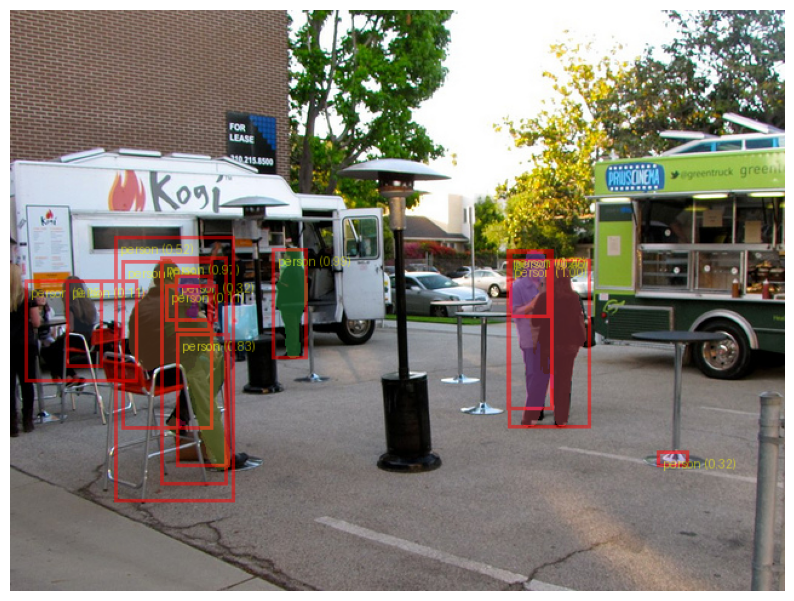


=== Processing: 000000156292.jpg ===
Original size: (428, 640)
Detections: 12
Scores: [0.9954171  0.9800551  0.6200205  0.5735534  0.17497896 0.16657619
 0.16369131 0.13322331 0.12396256 0.11156774]


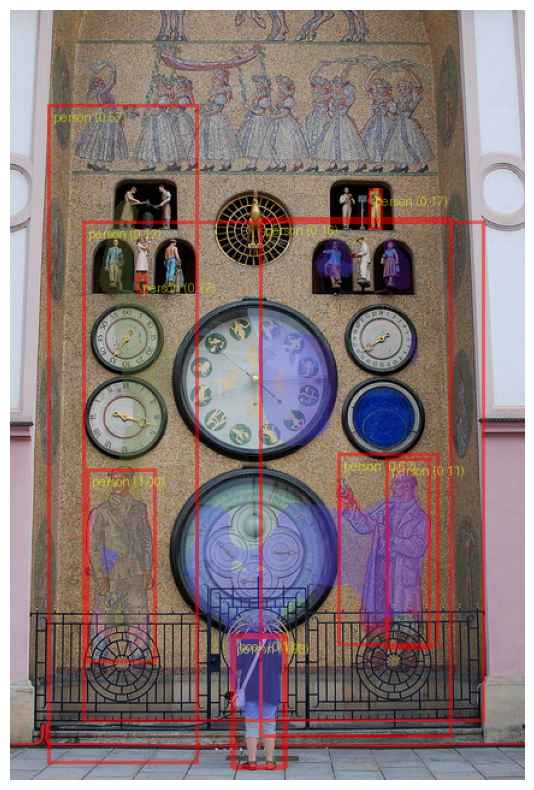

In [ ]:
for f in test_files:
    show_maskrcnn_prediction(os.path.join(TEST_DIR, f), model)

In [ ]:
def show_maskrcnn_prediction_contour(
        image_path,
        model,
        device=DEVICE,
        image_size=IMAGE_SIZE,
        score_threshold=0.30,
        max_instances=10
    ):
    print("\n=== Processing:", os.path.basename(image_path), "===")

    # Load original image
    try:
        img_pil = Image.open(image_path).convert("RGB")
    except Exception as e:
        print(" ERROR loading image:", e)
        return np.zeros((512,512,3), dtype=np.uint8)   # SAFE fallback

    W, H = img_pil.size
    orig = np.array(img_pil)

    # Preprocess
    transform = T.Compose([
        T.Resize((image_size, image_size)),
        T.ToTensor()
    ])
    img_t = transform(img_pil).to(device)

    # Inference
    try:
        model.eval()
        with torch.no_grad():
            out = model([img_t])[0]
    except Exception as e:
        print(" ERROR during model inference:", e)
        return orig.copy()   # safe fallback

    # Convert outputs
    try:
        boxes  = out["boxes"].cpu().numpy()
        labels = out["labels"].cpu().numpy()
        scores = out["scores"].cpu().numpy()
        masks  = out["masks"].cpu().numpy()[:, 0]
    except Exception as e:
        print(" ERROR parsing model output:", e)
        return orig.copy()

    # Filter
    keep = scores >= score_threshold
    boxes, labels, scores, masks = boxes[keep], labels[keep], scores[keep], masks[keep]

    if len(boxes) == 0:
        print(" No detections above threshold — returning original image")
        return orig.copy()

    # Limit
    if len(boxes) > max_instances:
        boxes, labels, scores, masks = (
            boxes[:max_instances],
            labels[:max_instances],
            scores[:max_instances],
            masks[:max_instances],
        )

    result = orig.copy()
    colors = random_colors(len(boxes))

    for i in range(len(boxes)):
        try:
            # Mask
            m_small = masks[i] > 0.5
            mask_img = Image.fromarray((m_small.astype(np.uint8) * 255))
            mask_big = mask_img.resize((W, H), Image.NEAREST)
            mask_big = np.array(mask_big) > 0
            color = np.array(colors[i], dtype=np.uint8)

            result[mask_big] = (0.7 * result[mask_big] + 0.3 * color).astype(np.uint8)

            # Contour
            mask_uint8 = (mask_big.astype(np.uint8) * 255)
            contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            for cnt in contours:
                cv2.drawContours(result, [cnt], -1, color.tolist(), 2)

            # Box
            x1, y1, x2, y2 = boxes[i]
            x1 = int(x1 * (W / image_size))
            y1 = int(y1 * (H / image_size))
            x2 = int(x2 * (W / image_size))
            y2 = int(y2 * (H / image_size))
            cv2.rectangle(result, (x1, y1), (x2, y2), color.tolist(), 3)

            # Label
            lbl = int(labels[i])
            cname = TARGET_CLASSES[lbl - 1]
            txt = f"{cname} {scores[i]:.2f}"

            (tw, th), _ = cv2.getTextSize(txt, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 2)
            cv2.rectangle(result, (x1, y1 - th - 6), (x1 + tw + 4, y1), (0, 0, 0), -1)
            cv2.putText(result, txt, (x1 + 2, y1 - 4),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,255,255), 2)

        except Exception as e:
            print(f"ERROR processing detection {i}:", e)
            continue

    return result


In [ ]:
import glob, os

test_imgs = []

for ext in ["*.jpg", "*.jpeg", "*.png"]:
    test_imgs.extend(glob.glob(os.path.join(TEST_DIR, ext)))

print("Found images:", len(test_imgs))
for img in test_imgs[:5]:
    print(img)

# Take first 5 images
imgs_to_run = test_imgs[:5]

for img_path in imgs_to_run:
    print("Running:", img_path)
    show_maskrcnn_prediction_contour(
        img_path,
        model,
        score_threshold=0.28,
        max_instances=3
    )



Found images: 30
/content/drive/MyDrive/coco2019/test-30/000000233771.jpg
/content/drive/MyDrive/coco2019/test-30/000000380913.jpg
/content/drive/MyDrive/coco2019/test-30/000000305317.jpg
/content/drive/MyDrive/coco2019/test-30/000000169356.jpg
/content/drive/MyDrive/coco2019/test-30/000000489305.jpg
Running: /content/drive/MyDrive/coco2019/test-30/000000233771.jpg

=== Processing: 000000233771.jpg ===
Running: /content/drive/MyDrive/coco2019/test-30/000000380913.jpg

=== Processing: 000000380913.jpg ===
Running: /content/drive/MyDrive/coco2019/test-30/000000305317.jpg

=== Processing: 000000305317.jpg ===
Running: /content/drive/MyDrive/coco2019/test-30/000000169356.jpg

=== Processing: 000000169356.jpg ===
Running: /content/drive/MyDrive/coco2019/test-30/000000489305.jpg

=== Processing: 000000489305.jpg ===
 No detections above threshold — returning original image


In [ ]:
import math
import matplotlib.pyplot as plt

def show_grid_predictions(image_paths, model, cols=3, score_threshold=0.30):
    """
    Runs Mask R-CNN visualizer on multiple images and displays them in a grid.
    """

    # take exactly 5 images
    image_paths = image_paths[:5]

    n = len(image_paths)
    rows = math.ceil(n / cols)

    plt.figure(figsize=(cols * 6, rows * 5))

    for i, img_path in enumerate(image_paths):

        pred_img = show_maskrcnn_prediction_contour(
            img_path,
            model,
            score_threshold=score_threshold,
            max_instances=5
        )

        plt.subplot(rows, cols, i + 1)
        plt.imshow(pred_img)
        plt.axis("off")
        plt.title(os.path.basename(img_path))

    plt.tight_layout()
    plt.show()



=== Processing: 000000233771.jpg ===

=== Processing: 000000380913.jpg ===

=== Processing: 000000305317.jpg ===

=== Processing: 000000169356.jpg ===

=== Processing: 000000489305.jpg ===
 No detections above threshold — returning original image


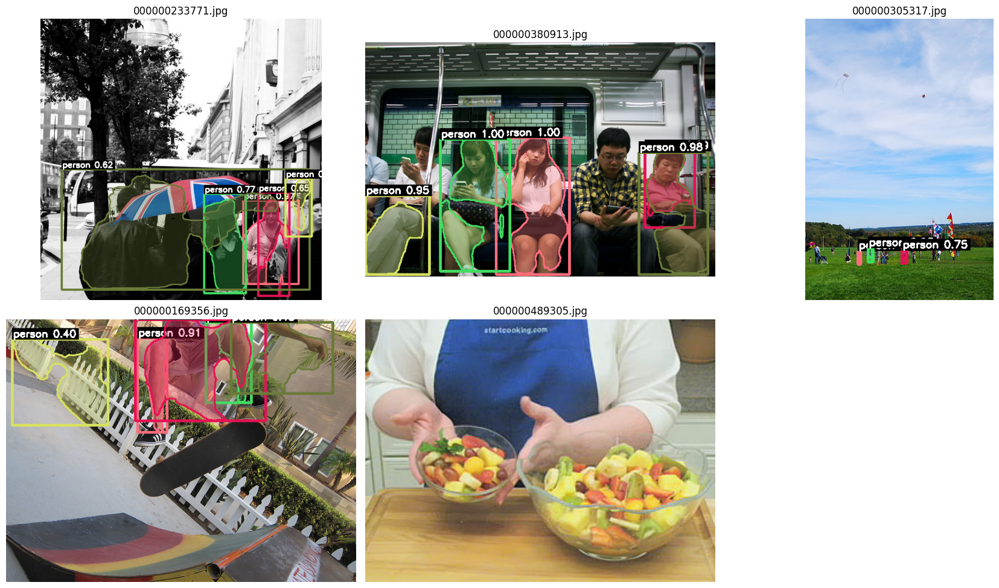

In [ ]:
show_grid_predictions(test_imgs, model, cols=3, score_threshold=0.28)


In [ ]:
# =====================================================================
#                FINAL MASK R-CNN TRAINING PIPELINE (STABLE)
# =====================================================================
import os, time, random, json
from collections import defaultdict
import numpy as np
import torch
import torchvision
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
import torchvision.transforms as T
import torchvision.transforms.functional as TF
from torchvision.transforms import InterpolationMode
from PIL import Image
import cv2

# =====================================================================
# PATHS YOU PROVIDED (DO NOT CHANGE)
# =====================================================================
TRAIN_JSON = "/content/drive/MyDrive/coco2019/train-300/labels.json"
VAL_JSON   = "/content/drive/MyDrive/coco2019/validation-300/labels.json"
TRAIN_IMG_DIR = "/content/drive/MyDrive/coco2019/train-300/data"
VAL_IMG_DIR   = "/content/drive/MyDrive/coco2019/validation-300/data"
OUTPUT_DIR = "/content/output"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# =====================================================================
# HYPERPARAMETERS
# =====================================================================
TARGET_CAT_IDS = [1,2,3,4]  # person, cat, sports ball, book
NUM_CLASSES = 1 + len(TARGET_CAT_IDS)
IMAGE_SIZE = 800
BATCH_SIZE = 4
NUM_WORKERS = 4
LR = 1e-4
EPOCHS = 10
PRINT_EVERY = 50

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", DEVICE)
print("Torch:", torch.__version__)
print("TorchVision:", torchvision.__version__)

# =====================================================================
#    MASK DECODER (POLYGON / RLE / BBOX FALLBACK) — SAFE VERSION
# =====================================================================
def ann_to_mask_clean(ann, H, W):
    seg = ann.get("segmentation", None)
    try:
        # RLE
        if isinstance(seg, dict) and "counts" in seg:
            try:
                from pycocotools import mask as maskUtils
                m = maskUtils.decode(seg)
                if m.ndim == 3:
                    m = m[:,:,0]
                return (m > 0).astype(np.uint8)
            except:
                pass

        # Polygon
        if isinstance(seg, list):
            mask = np.zeros((H, W), dtype=np.uint8)
            for poly in seg:
                pts = np.array(poly).reshape(-1,2).astype(np.int32)
                if len(pts) >= 3:
                    cv2.fillPoly(mask, [pts], 1)
            return mask

        # Bbox fallback
        x,y,w,h = ann["bbox"]
        mask = np.zeros((H,W), dtype=np.uint8)
        mask[int(y):int(y+h), int(x):int(x+w)] = 1
        return mask
    except:
        return None

# =====================================================================
# AUGMENTATION (NO INVALID MASK GENERATION)
# =====================================================================
class MaskAugment:
    def __init__(self, size):
        self.size = size
        self.cj = T.ColorJitter(0.25,0.25,0.25,0.05)

    def __call__(self, img, masks):
        img = self.cj(img)
        pil_masks = [Image.fromarray((m*255).astype(np.uint8)) for m in masks]

        # HFlip
        if random.random() < 0.5:
            img = TF.hflip(img)
            pil_masks = [TF.hflip(m) for m in pil_masks]

        # Rotate
        if random.random() < 0.4:
            ang = random.uniform(-20,20)
            img = TF.rotate(img, ang, interpolation=InterpolationMode.BILINEAR)
            pil_masks = [
                TF.rotate(m, ang, interpolation=InterpolationMode.NEAREST)
                for m in pil_masks
            ]

        # Affine
        if random.random() < 0.4:
            tx = int(0.05 * img.width)
            ty = int(0.05 * img.height)
            shear = random.uniform(-5, 5)

            img = TF.affine(
                img, 0, (tx,ty), 1.0, shear,
                interpolation=InterpolationMode.BILINEAR
            )

            pil_masks = [
                TF.affine(
                    m, 0, (tx,ty), 1.0, shear,
                    interpolation=InterpolationMode.NEAREST
                )
                for m in pil_masks
            ]

        # Resize
        img = TF.resize(img, (self.size,self.size),
                        interpolation=InterpolationMode.BILINEAR)

        pil_masks = [
            TF.resize(m, (self.size,self.size),
                      interpolation=InterpolationMode.NEAREST)
            for m in pil_masks
        ]

        masks_out = [(np.array(m) > 127).astype(np.uint8) for m in pil_masks]
        return img, masks_out

# =====================================================================
# DATASET CLASS — FINAL, STABLE, NO NAN
# =====================================================================
class RobustMaskRCNNDataset(Dataset):
    def __init__(self, json_path, img_dir, target_cats, size, augment=False):
        self.size = size
        self.img_dir = img_dir
        self.augment = augment
        self.target_cats = target_cats
        self.aug = MaskAugment(size) if augment else None
        self.tf = T.ToTensor()

        with open(json_path) as f:
            coco = json.load(f)

        self.images = {img["id"]: img for img in coco["images"]}
        self.ann_map = defaultdict(list)

        for a in coco["annotations"]:
            if a["category_id"] in target_cats:
                self.ann_map[a["image_id"]].append(a)

        self.ids = sorted(self.ann_map.keys())
        self.cat2label = {cid: i+1 for i,cid in enumerate(target_cats)}

    def __len__(self):
        return len(self.ids)

    def __getitem__(self, idx):
        img_id = self.ids[idx]
        info = self.images[img_id]

        img_path = os.path.join(self.img_dir, info["file_name"])
        img = Image.open(img_path).convert("RGB")
        W,H = img.size

        masks = []
        labels = []

        # ---------- READ MASKS ----------
        for ann in self.ann_map[img_id]:
            m = ann_to_mask_clean(ann, H, W)
            if m is None or m.sum() < 10:
                continue
            masks.append(m)
            labels.append(self.cat2label[ann["category_id"]])

        # ---------- EMPTY CASE ----------
        if len(masks)==0:
            img = TF.resize(img, (self.size,self.size))
            img_t = self.tf(img)
            return img_t, {
                "boxes": torch.zeros((0,4)),
                "labels": torch.zeros((0,),dtype=torch.int64),
                "masks": torch.zeros((0,self.size,self.size),dtype=torch.uint8),
                "image_id": torch.tensor([img_id])
            }

        # ---------- AUGMENT ----------
        if self.augment:
            img, masks = self.aug(img, masks)
        else:
            img = TF.resize(img, (self.size,self.size))

        img_t = self.tf(img)

        # ---------- RESIZE MASKS ----------
        resized_masks = []
        new_labels = []
        for m,lbl in zip(masks,labels):
            mr = cv2.resize(
                m.astype(np.uint8),
                (self.size,self.size),
                interpolation=cv2.INTER_NEAREST
            )
            if mr.sum() < 10:
                continue
            resized_masks.append(mr)
            new_labels.append(lbl)

        if len(resized_masks)==0:
            return img_t, {
                "boxes": torch.zeros((0,4)),
                "labels": torch.zeros((0,),dtype=torch.int64),
                "masks": torch.zeros((0,self.size,self.size),dtype=torch.uint8),
                "image_id": torch.tensor([img_id])
            }

        masks_t = torch.tensor(np.stack([(m>0).astype(np.uint8) for m in resized_masks]))

        # ---------- BOXES FROM MASKS ----------
        boxes = []
        for m in resized_masks:
            ys, xs = np.where(m > 0)
            if len(xs)<2 or len(ys)<2:
                continue
            x1,x2 = xs.min(), xs.max()
            y1,y2 = ys.min(), ys.max()
            if x2<=x1 or y2<=y1:
                continue
            boxes.append([float(x1),float(y1),float(x2),float(y2)])

        if len(boxes)==0:
            boxes_t = torch.zeros((0,4))
            labels_t = torch.zeros((0,),dtype=torch.int64)
        else:
            boxes_t = torch.tensor(boxes, dtype=torch.float32)
            labels_t = torch.tensor(new_labels, dtype=torch.int64)

        return img_t, {
            "boxes": boxes_t,
            "labels": labels_t,
            "masks": masks_t,
            "image_id": torch.tensor([img_id])
        }

# =====================================================================
# BUILD DATASETS
# =====================================================================
train_ds = RobustMaskRCNNDataset(TRAIN_JSON, TRAIN_IMG_DIR, TARGET_CAT_IDS, IMAGE_SIZE, augment=True)
val_ds   = RobustMaskRCNNDataset(VAL_JSON,   VAL_IMG_DIR,   TARGET_CAT_IDS, IMAGE_SIZE, augment=False)

# =====================================================================
# WEIGHTED SAMPLER (FIX IMBALANCE)
# =====================================================================
img_label_counts = defaultdict(int)
img_to_label = {}

for img_id in train_ds.ids:
    anns = train_ds.ann_map[img_id]
    if len(anns)==0:
        lbl = TARGET_CAT_IDS[0]
    else:
        cats = [a["category_id"] for a in anns]
        lbl = max(set(cats), key=cats.count)
    img_label_counts[lbl] += 1
    img_to_label[img_id] = lbl

weights = [
    1.0/max(1,img_label_counts[img_to_label[i]])
    for i in train_ds.ids
]

sampler = WeightedRandomSampler(weights, num_samples=len(weights), replacement=True)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, sampler=sampler,
                          num_workers=NUM_WORKERS, collate_fn=lambda x: tuple(zip(*x)))
val_loader   = DataLoader(val_ds, batch_size=1, shuffle=False,
                          num_workers=NUM_WORKERS, collate_fn=lambda x: tuple(zip(*x)))

print("Train size:", len(train_ds), " Val size:", len(val_ds))
print("Label counts:", dict(img_label_counts))

# =====================================================================
# MASK R-CNN MODEL (R50-FPN)
# =====================================================================
def build_model(num_classes):
    model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights=None)
    in_feats = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_feats, num_classes)
    in_mask_feats = model.roi_heads.mask_predictor.conv5_mask.in_channels
    model.roi_heads.mask_predictor = torchvision.models.detection.mask_rcnn.MaskRCNNPredictor(in_mask_feats, 256, num_classes)
    return model

model = build_model(NUM_CLASSES).to(DEVICE)
optimizer = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-4)
scaler = torch.amp.GradScaler("cuda") if DEVICE=="cuda" else None
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=EPOCHS)

# =====================================================================
# mIoU HELPERS
# =====================================================================
def masks_to_semantic(masks, labels, size):
    sem = np.zeros((size,size), dtype=np.int32)
    for i in range(len(labels)):
        sem[masks[i]>0] = int(labels[i])
    return sem

def compute_cm(true_sem, pred_sem, num_classes):
    combined = num_classes*true_sem.flatten() + pred_sem.flatten()
    hist = np.bincount(combined, minlength=num_classes*num_classes)
    return hist.reshape((num_classes,num_classes))

def iou_from_cm(cm):
    tp = np.diag(cm)
    fp = cm.sum(0) - tp
    fn = cm.sum(1) - tp
    return tp/(tp+fp+fn+1e-9)

# =====================================================================
# TRAINING LOOP
# =====================================================================
best_miou = 0.0
ckpt_path = f"{OUTPUT_DIR}/maskrcnn_best.pth"

for epoch in range(1, EPOCHS+1):
    model.train()
    total_loss = 0
    steps = 0
    tstart = time.time()

    for step, (imgs, tgts) in enumerate(train_loader):
        imgs = [i.to(DEVICE) for i in imgs]
        tgts = [{k: v.to(DEVICE) for k,v in t.items()} for t in tgts]

        optimizer.zero_grad()

        if DEVICE=="cuda":
            with torch.amp.autocast("cuda"):
                loss_dict = model(imgs, tgts)
                loss = sum(loss_dict.values())
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
        else:
            loss_dict = model(imgs, tgts)
            loss = sum(loss_dict.values())
            loss.backward()
            optimizer.step()

        total_loss += loss.item()
        steps += 1

        if (step+1) % PRINT_EVERY == 0:
            print(f"Epoch {epoch} Step {step+1} | Loss {total_loss/steps:.4f}")

    scheduler.step()
    avg_loss = total_loss/steps

    # =================================================================
    # VALIDATION
    # =================================================================
    model.eval()
    cm = np.zeros((NUM_CLASSES,NUM_CLASSES), dtype=np.int64)

    with torch.no_grad():
        for imgs, tgts in val_loader:
            img = imgs[0].to(DEVICE)
            out = model([img])[0]

            # predicted semantic
            if len(out["masks"])>0:
                pm = (out["masks"]>0.5).squeeze(1).cpu().numpy()
                pl = out["labels"].cpu().numpy()
                pm_rs = np.stack([
                    cv2.resize(m.astype(np.uint8), (IMAGE_SIZE,IMAGE_SIZE),
                               interpolation=cv2.INTER_NEAREST)
                    for m in pm
                ])
                pred_sem = masks_to_semantic(pm_rs, pl, IMAGE_SIZE)
            else:
                pred_sem = np.zeros((IMAGE_SIZE,IMAGE_SIZE),dtype=np.int32)

            # ground truth semantic
            t = tgts[0]
            if t["masks"].shape[0]>0:
                true_sem = masks_to_semantic(
                    t["masks"].cpu().numpy(),
                    t["labels"].cpu().numpy(),
                    IMAGE_SIZE
                )
            else:
                true_sem = np.zeros((IMAGE_SIZE,IMAGE_SIZE),dtype=np.int32)

            cm += compute_cm(true_sem, pred_sem, NUM_CLASSES)

    iou = iou_from_cm(cm)
    miou = float(np.mean(iou))

    print(f"\nEpoch {epoch}/{EPOCHS} | Loss={avg_loss:.4f} | mIoU={miou:.4f} | time={time.time()-tstart:.1f}s")
    for i,val in enumerate(iou):
        print(f"  Class {i} IoU: {val:.4f}")

    if miou > best_miou:
        best_miou = miou
        torch.save({"model":model.state_dict(),"miou":miou,"epoch":epoch}, ckpt_path)
        print("Saved best model:", ckpt_path)

print("\nTraining Finished")
print("BEST mIoU =", best_miou)


Device: cuda
Torch: 2.9.0+cu126
TorchVision: 0.24.0+cu126
Train size: 266  Val size: 269
Label counts: {1: 253, 3: 10, 2: 2, 4: 1}
Epoch 1 Step 50 | Loss 1.5988

Epoch 1/10 | Loss=1.5536 | mIoU=0.2073 | time=93.9s
  Class 0 IoU: 0.7466
  Class 1 IoU: 0.2481
  Class 2 IoU: 0.0265
  Class 3 IoU: 0.0097
  Class 4 IoU: 0.0056
Saved best model: /content/output/maskrcnn_best.pth
Epoch 2 Step 50 | Loss 1.2413

Epoch 2/10 | Loss=1.2155 | mIoU=0.1999 | time=93.9s
  Class 0 IoU: 0.6864
  Class 1 IoU: 0.2669
  Class 2 IoU: 0.0208
  Class 3 IoU: 0.0206
  Class 4 IoU: 0.0048
Epoch 3 Step 50 | Loss 1.0835

Epoch 3/10 | Loss=1.0655 | mIoU=0.2175 | time=82.2s
  Class 0 IoU: 0.7602
  Class 1 IoU: 0.2801
  Class 2 IoU: 0.0070
  Class 3 IoU: 0.0331
  Class 4 IoU: 0.0069
Saved best model: /content/output/maskrcnn_best.pth
Epoch 4 Step 50 | Loss 1.0369

Epoch 4/10 | Loss=0.9992 | mIoU=0.2173 | time=90.8s
  Class 0 IoU: 0.7376
  Class 1 IoU: 0.3036
  Class 2 IoU: 0.0125
  Class 3 IoU: 0.0268
  Class 4 IoU: 